# Compute Transit Time (Tc or T0) from Keplerian Elements

Assuming that the (X-Y) plane is the sky plane.  
The X-axis is horizontal and positive to the right.  
The Y-axis is vertical and positive to the top.  
The Z-axis is vertical and positive to the observer.  

The star is at the origin (0, 0, 0).  

<!-- ![Orbit3D](/home/borsato/Dropbox/Coding/python/trades_check/pics/Orbit3D.png)   -->
<!-- ![Transit](/home/borsato/Dropbox/Coding/python/trades_check/pics/Transit.png)   -->
![Orbit3D](./pics/Orbit3D.png)  
![Transit](./pics/Transit.png)  

The longitude of the ascending node $\Omega$ is the angle between the positive X-axis and the ascending node, measured in the sky plane.
The argument of periastron $\omega$ is the angle between the ascending node and the periastron, measured in the sky plane.  
The true anomaly $\nu$ is the angle between the periastron and the current position of the planet, measured in the sky plane.  

To go from the orbital plane $(x,y,z)$ to the sky plane $(X, Y, Z)$ we have to apply the rotation:  
$$\begin{pmatrix} X \\ Y \\ Z \end{pmatrix} = P_{3}(\Omega)P_{1}(i)P_{3}(\omega) \begin{pmatrix} x \\ y \\ z \end{pmatrix}$$  
where $P_{3}(\theta)$ is the rotation matrix around the Z-axis by the angle $\theta$ and $P_{1}(\theta)$ is the rotation matrix around the X-axis by the angle $\theta$.  

The argument of latitude $u$ is given by $u = \omega + \nu$.  
The true longitude $\theta$ is given by $\theta = \Omega + \omega + \nu = \Omega + u$.  

So, changing the value of $\Omega$ does not change the value of $u = \omega + \nu$ at the transit time (Tc), that is:  
$u(\mathrm{Tc}) = \omega + \nu = \frac{\pi}{2}$.  

Generating parameters in fitting process, such as `PyDE` or `emcee`, or `dynesty`, etc:  
- mean anomaly $\mathcal{M}_{te,fit}$ at dynamical reference time ($te$)  
- arg. of pericentre $\omega_{te,fit}$  
- period $P_{te,fit}$  
- eccentricity $e_{te,fit}$.  
<!-- - longitude of ascending node $\Omega_{te,fit}$.   -->

Given $u_\mathrm{Tc} = u(\mathrm{Tc}) = \frac{\pi}{2}$:  
- true anomaly $\nu_\mathrm{Tc} = \nu(\mathrm{Tc}) = \frac{\pi}{2} - \omega_{te,fit}$  
- from $\nu_\mathrm{Tc}$ compute the eccentric anomaly $E(\mathrm{Tc})$ and then the mean anomaly $\mathcal{M}_\mathrm{Tc}$  
- compute the transit time $\mathrm{Tc} = te + \frac{P_{te,fit}}{2\pi} ( \mathcal{M}_\mathrm{Tc} - \mathcal{M}_{te,fit} )$  
- find the observed transit time $\mathrm{Tc_{obs}}$ closest to the dynamical reference time $te$  
- compute the scaled difference: $\Delta t = (\mathrm{Tc_{obs}} - Tc) - P_{te,fit} * \mathrm{int}((\mathrm{Tc_{obs}} - \mathrm{Tc})/P_{te,fit})$  
- select parameters that satisfy the condition $|\Delta t| < 1\ $days  

Compare parameters generated randomly, based on $\Delta t$ condition, and sample parameters from the posterior distribution.

In [1]:
import numpy as np
import pandas as pd
import os
import h5py
from pytrades import ancillary as anc
import matplotlib.pyplot as plt
anc.set_rcParams()

In [2]:
def true_anomaly_from_argument_of_latitude(argp):
    return (90.0 - argp)%360.0

def ecc_anomaly_from_true_anomaly(true_anomaly, eccentricity):
    
    truea = np.deg2rad(true_anomaly)
    
    tan_hta = np.tan(0.5*truea)
    ecoeff = np.sqrt((1-eccentricity)/(1+eccentricity))
    eccanom = np.rad2deg(2*np.arctan(ecoeff*tan_hta))%360.0

    return eccanom

def mean_anomaly_from_eccentric_anomaly(ecc_anomaly, eccentricity):
    
    ecca = np.deg2rad(ecc_anomaly)
    meana = np.rad2deg(ecca - eccentricity*np.sin(ecca))

    return meana

def transit_time_from_mean_anomalies(t_e, P, meana_tc, meana_te):
    return t_e + (P/(2*np.pi))*np.deg2rad(meana_tc - meana_te)

def tc_from_keplerian_elements(t_e, P, ecc, argp, meana):

    nu_tc = true_anomaly_from_argument_of_latitude(argp)
    ecca_tc = ecc_anomaly_from_true_anomaly(nu_tc, ecc)
    meana_tc = mean_anomaly_from_eccentric_anomaly(ecca_tc, ecc)

    tc = transit_time_from_mean_anomalies(t_e, P, meana_tc, meana)
    
    return tc

def compute_delta_time(obsT0, Tc, P):

    dt = obsT0 - Tc
    idtp = np.rint(dt/P)
    dtp = dt - idtp*P

    return dt, idtp, dtp

def transit_times_from_keplerian_elements(t_e, P, ecc, argp, meana, obs_t0):

    tc = tc_from_keplerian_elements(t_e, P, ecc, argp, meana)
    
    obs_epo = anc.compute_epoch(tc, P, obs_t0)
    tnew_list = np.zeros(len(obs_epo))
    dt_list = np.zeros(len(obs_epo))
    idtp_list = np.zeros(len(obs_epo))
    dtp_list = np.zeros(len(obs_epo))
    for iepo, epo in enumerate(obs_epo):
        tnew = tc + epo*P
        tnew_list[iepo] = tnew
        dt, idtp, dtp = compute_delta_time(obs_t0[iepo], tnew, P)
        dt_list[iepo] = dt
        idtp_list[iepo] = idtp
        dtp_list[iepo] = dtp

    return tc, tnew_list, dt_list, idtp_list, dtp_list

def transit_time_close_to_tepoch(t_e, obs_t0):

    adt = np.abs(np.asarray(obs_t0) - t_e)
    idx_min = np.argmin(adt)
    tx = obs_t0[idx_min]

    return tx


def get_param_samples(key, fix_n, fix_p, fit_n, fit_p, phy_n, phy_p):

    nx,_ = np.shape(fit_p)
    x = None
    if key in fix_n:
        x = np.zeros((nx)) + fix_p[list(fix_n).index(key)]
    elif key in phy_n:
        x = phy_p[:,list(phy_n).index(key)]
    elif key in fit_n:
        x = fit_p[:,list(fit_n).index(key)]
    else:
        print(f'{key} not found')

    return x

class Stats:
    def __init__(self, x):
        self.x = x
        self.mean = np.mean(x)
        self.std = np.std(x, ddof=1)
        self.median = np.median(x)
        self.p68 = np.percentile(np.abs(x-self.median), 68.27)
        return
    def __repr__(self):
        return f"Stats(mean={self.mean:.5f}, std={self.std:.5f}, median={self.median:.5f}, p68={self.p68:.5f})"

def scatter_corr(ax, x1, x1name, x2, x2name, sel):

    lrand, = ax.plot(
        x1, x2,
        color='lightgray',
        marker='o',
        ms=1,
        mec='none',
        linestyle='none',
        alpha=0.5,
        zorder=5,
        label="random"
    )

    lsel, = ax.plot(
        x1[sel], x2[sel],
        color='C1',
        marker='o',
        ms=1.5,
        mec='none',
        linestyle='none',
        alpha=1.0,
        zorder=6,
        label="$|\Delta t|< 1\ d$"
    )
    
    return lrand, lsel

def load_posterior_samples(posterior_file, nsmp=2000, seed=42):

    out = {}

    # read posterior file
    with h5py.File(posterior_file, 'r') as hf:
        fixed_parameters = hf['fixed_parameters'][...]
        fixed_names = anc.decode_list(hf['fixed_parameters'].attrs['names'])
        fitting_names = anc.decode_list(hf['fitting_names'][...])
        fitting_posterior = hf['posterior'][...]
        physical_names = anc.decode_list(hf['physical_names'][...])
        physical_posterior = hf['posterior_physical'][...]
        stellar_mass = hf['stellar_mass'][...]
        stellar_radius = hf['stellar_radius'][...]
        
    npost, nfit = np.shape(fitting_posterior)

    np.random.seed(seed)
    idx_smp = np.random.choice(npost, nsmp, replace=False)
    fitting_posterior = fitting_posterior[idx_smp, :]
    physical_posterior = physical_posterior[idx_smp, :]
    stellar_mass = stellar_mass[idx_smp]
    stellar_radius = stellar_radius[idx_smp]

    print(f"fixed_names    = {fixed_names}")
    print(f"fitting_names  = {fitting_names}")
    print(f"physical_names = {physical_names}")

    out = {
        "seed": seed,
        "nsmp":nsmp,
        "nfit":nfit,
        "fixed_parameters": fixed_parameters,
        "fixed_names": fixed_names,
        "fitting_names": fitting_names,
        "fitting_posterior": fitting_posterior,
        "physical_names": physical_names,
        "physical_posterior": physical_posterior,
        "stellar_mass": stellar_mass,
        "stellar_radius": stellar_radius
    }

    return out

### FULLSIM

In [3]:
class FULLSIM:
    def __init__(self, main_folder, t_epoch, planet_nums = [2,3], nsmp=2000, seed=42, target_name="?"):
        self.main_folder = main_folder
        self.posterior_file = os.path.join(
            main_folder, "posterior.hdf5"
        )
        self.planet_nums = planet_nums
        self.seed = seed
        self.nsmp = nsmp
        self.t_epoch = t_epoch
        self.target_name = target_name
        return
    
    def load_posterior(self):
        print(f"loading posterior from {self.posterior_file}")
        post = load_posterior_samples(self.posterior_file, nsmp=self.nsmp, seed=self.seed)
        self.nfit = post['nfit']
        self.fixed_names = post['fixed_names']
        self.fixed_parameters = post['fixed_parameters']
        self.fitting_names = post['fitting_names']
        self.fitting_posterior = post['fitting_posterior']
        self.physical_names = post['physical_names']
        self.physical_posterior = post['physical_posterior']
        self.stellar_mass = post['stellar_mass']
        self.stellar_radius = post['stellar_radius']
        return
    
    def load_observation_times(self):
        print("loading observation times")
        self.obs_T0s = {}
        for inb in self.planet_nums:
            t0 = np.genfromtxt(
                os.path.join(self.main_folder, f"NB{inb}_observations.dat"),
                usecols=(1),
            )
            self.obs_T0s[inb] = t0
        self.oT02te = {}
        print("planet t_epoch --> obsT0")
        for inb in self.planet_nums:
            self.oT02te[inb] = transit_time_close_to_tepoch(self.t_epoch, self.obs_T0s[inb])
            print(inb, self.t_epoch, " --> ", self.oT02te[inb])
        return
    
    def set_samples(self):
        print("setting samples")
        self.Psmp  = np.array([get_param_samples(f"P{i}",  self.fixed_names, self.fixed_parameters, self.fitting_names, self.fitting_posterior, self.physical_names, self.physical_posterior) for i in self.planet_nums]).T
        self.esmp  = np.array([get_param_samples(f"e{i}",  self.fixed_names, self.fixed_parameters, self.fitting_names, self.fitting_posterior, self.physical_names, self.physical_posterior) for i in self.planet_nums]).T
        self.wsmp  = np.array([get_param_samples(f"w{i}",  self.fixed_names, self.fixed_parameters, self.fitting_names, self.fitting_posterior, self.physical_names, self.physical_posterior)%360.0 for i in self.planet_nums]).T
        self.lnsmp = np.array([get_param_samples(f"lN{i}", self.fixed_names, self.fixed_parameters, self.fitting_names, self.fitting_posterior, self.physical_names, self.physical_posterior)%360.0 for i in self.planet_nums]).T
        self.masmp = np.array([get_param_samples(f"mA{i}", self.fixed_names, self.fixed_parameters, self.fitting_names, self.fitting_posterior, self.physical_names, self.physical_posterior)%360.0 for i in self.planet_nums]).T

        # self.tc_smp = np.array(tc_from_keplerian_elements(self.t_epoch, self.Psmp, self.esmp, self.wsmp, self.lnsmp, self.masmp))
        self.tc_smp = np.array(tc_from_keplerian_elements(self.t_epoch, self.Psmp, self.esmp, self.wsmp, self.masmp))
        self.dtc_smp = np.array([compute_delta_time(t2te, self.tc_smp[:, i], self.Psmp[:,i])[2] for i, t2te in enumerate(self.oT02te)]).T
        self.stats_smp = {}
        for i, inb in enumerate(self.planet_nums):
            self.stats_smp[inb] = Stats(self.dtc_smp[:, i])
            print(inb, " --> ", self.stats_smp[inb])
        return
    
    def generate_random(self, Pbd, ebd, abd, lbd, nx=10000, seed=42):
        print("generating random samples")
        self.Pbd = Pbd
        self.ebd = ebd
        self.abd = abd
        self.lbd = lbd
        np.random.seed(seed)
        self.prn  = np.array([bd[0] + np.random.rand(nx) * np.ptp(bd) for bd in Pbd]).T
        self.ern  = np.array([bd[0] + np.random.rand(nx) * np.ptp(bd) for bd in ebd]).T
        self.wrn  = np.array([bd[0] + np.random.rand(nx) * np.ptp(bd) for bd in abd]).T
        self.lnrn = np.array([bd[0] + np.random.rand(nx) * np.ptp(bd) for bd in lbd]).T
        self.marn = np.array([bd[0] + np.random.rand(nx) * np.ptp(bd) for bd in abd]).T
        self.tc_rn = np.array([
            np.array(tc_from_keplerian_elements(
                self.t_epoch, 
                self.prn[:,i],
                self.ern[:,i],
                self.wrn[:,i],
                # self.lnrn[:,i],
                self.marn[:,i]
            )) for i, _ in enumerate(self.planet_nums)
        ]).T
        tc_rn = []
        dtc_rn = []
        for i, t2te in enumerate(self.oT02te.values()):
            tcrn = tc_from_keplerian_elements(
                self.t_epoch, 
                self.prn[:,i],
                self.ern[:,i],
                self.wrn[:,i],
                # self.lnrn[:,i],
                self.marn[:,i]
            )
            tc_rn.append(tcrn)
            _, _, dt = compute_delta_time(t2te, tcrn, self.prn[:, i])
            dtc_rn.append(dt)
        self.tc_rn = np.column_stack(tc_rn)
        self.dtc_rn = np.column_stack(dtc_rn)
        self.stats_rn = {}
        for i, inb in enumerate(self.planet_nums):
            self.stats_rn[inb] = Stats(self.dtc_rn[:,i])
            print(inb, " --> ", self.stats_rn[inb])
        
        print("Selecting Tc within 1 day for closest observed transit time")
        self.sel_within1d = [] 
        self.stats_w1d = {}
        for i, inb in enumerate(self.planet_nums):
            sel = np.abs(self.dtc_rn[:,i]) < 1.0
            self.sel_within1d.append(sel)
            nw1d = np.sum(sel)
            print(f"{nw1d}/{nx}={100*nw1d/nx:.2f}%")
            dtc_rn_w1d = self.dtc_rn[sel, i]
            s = Stats(dtc_rn_w1d)
            self.stats_w1d[inb] = s
            print(inb, " --> ", s)
        return
        
    def plot(self):
        print("plotting")
        pars = [self.prn, self.ern, self.wrn, self.lnrn, self.marn]
        nfit = len(pars)
        pnames = ["period(days)", "ecc", "$\omega$(deg)", "$\Omega$(deg)", "$\mathcal{M}$(deg)"]
        smp = [self.Psmp, self.esmp, self.wsmp, self.lnsmp, self.masmp]

        for i, inb in enumerate(self.planet_nums):
            tt = f"{self.target_name} planet {inb}"
            print(tt)
            fig = plt.figure(figsize=(10,10))
            plt.figtext(0.25, 0.76, tt)
            axs = []
            
            cnt=0
            lcnt = 0
            for ix in range(0, nfit, 1):
                xval = pars[ix][:,i]
                xlab = pnames[ix]
                xc = smp[ix][:,i]
                for iy in range(nfit - 1, -1, -1):
                    yval = pars[iy][:,i]
                    ylab = pnames[iy]
                    yc = smp[iy][:,i]
                    ll = f"{cnt:2d}: ({ix},{iy}) = ({xlab}: {np.median(xc):.5f},{ylab}: {np.median(yc):.5f})"
                    if iy > ix:
                        cnt += 1
                        ax = plt.subplot2grid((nfit + 1, nfit), (iy, ix))
                        ax.get_xaxis().set_visible(False)
                        ax.get_yaxis().set_visible(False)
                        lrand, lsel = scatter_corr(ax, xval, xlab, yval, ylab, self.sel_within1d[i])
                        lsmp, = ax.plot(
                            xc, yc,
                            color="C0", 
                            marker="o",
                            ms=1.6,
                            mec='None',
                            ls='',
                            zorder=8,
                            alpha=1,
                            label="samples"
                        )
                        if lcnt == 0:
                            leg = [lrand, lsel, lsmp]
                            lcnt += 1
                        if iy == nfit - 1:
                            ax.get_xaxis().set_visible(True)
                            ax.xaxis.set_tick_params(labelsize=6)
                            plt.setp(ax.xaxis.get_majorticklabels(), rotation=70)
                            ax.set_xlabel(xlab, fontsize=8, rotation=00.0)
                        if ix == 0:
                            ax.get_yaxis().set_visible(True)
                            ax.yaxis.set_tick_params(labelsize=6)
                            ax.set_ylabel(ylab, fontsize=8, rotation=90.0)
                        axs.append(ax)
                        print(ll)
            
            fig.align_ylabels(axs)
            fig.align_xlabels(axs)
            fig.subplots_adjust(wspace=0.05, hspace=0.05)
            fig.legend(
                handles=leg, 
                loc='lower left',
                bbox_to_anchor=(0.45, 0.6),
                markerscale=3
            )
            plt.show()
            plt.close(fig)
        return

## TOI-1130b by Borsato et al., 2024

In [4]:
t_e = 2458657.0
obs_t0 = np.array([
    1658.73999,
    1662.81104,
    1666.88336,
    1670.95086,
    1675.01606,
    1679.07242,
    1731.94194,
    2037.94623,
    2042.00827,
    2046.07458,
    2050.14405,
    2054.21920,
    2058.29358
]) + 2457000.0

P_b = 4.074554
e_b = 0.052162
longn_b = 180.0
meana_b = 159.7
argp_b = 141.11


# Compute the transit times
print(f"longn + meana + argp = {(longn_b + meana_b + argp_b)%360.0:.5f}")
print(f"meana + argp         = {(meana_b + argp_b)%360.0:.5f}")
print(f"longn                = {longn_b:.5f}")
print(f"meana                = {meana_b:.5f}")
print(f"argp                 = {argp_b:.5f}")
tc_b, tnew_b, dt_b, idtp_b, dtp_b = transit_times_from_keplerian_elements(
    t_e,
    P_b,
    e_b,
    argp_b,
    # longn_b,
    meana_b,
    obs_t0
)
obs_epo = anc.compute_epoch(tc_b, P_b, obs_t0)
print(f"Transit time computed = {tc_b:.5f} (t_epoch = {t_e:.5f})")
print(f"{'epo':>3s} ==> {'obs_t0':>15s} - {'tnew':>15s} = {'dt':>12s} days {'dt%P':8s} idtp test")
for iepo, epo in enumerate(obs_epo):
    tnew = tnew_b[iepo]
    dt = dt_b[iepo]
    idtp = idtp_b[iepo] #np.rint(dt/P_b)
    test = dtp_b[iepo] # dt - P_b*idtp
    print(f"{epo:>3.0f} ==> {obs_t0[iepo]:15.5f} - {tnew:15.5f} = {dt:+12.5f} days {dtp_b[iepo]:+8.5f} {idtp:+4.0f} {test:+.5f}")

longn + meana + argp = 120.81000
meana + argp         = 300.81000
longn                = 180.00000
meana                = 159.70000
argp                 = 141.11000
Transit time computed = 2458658.73994 (t_epoch = 2458657.00000)
epo ==>          obs_t0 -            tnew =           dt days dt%P     idtp test
  0 ==>   2458658.73999 -   2458658.73994 =     +0.00005 days +0.00005   +0 +0.00005
  1 ==>   2458662.81104 -   2458662.81449 =     -0.00345 days -0.00345   -0 -0.00345
  2 ==>   2458666.88336 -   2458666.88905 =     -0.00569 days -0.00569   -0 -0.00569
  3 ==>   2458670.95086 -   2458670.96360 =     -0.01274 days -0.01274   -0 -0.01274
  4 ==>   2458675.01606 -   2458675.03816 =     -0.02210 days -0.02210   -0 -0.02210
  5 ==>   2458679.07242 -   2458679.11271 =     -0.04029 days -0.04029   -0 -0.04029
 18 ==>   2458731.94194 -   2458732.08191 =     -0.13997 days -0.13997   -0 -0.13997
 93 ==>   2459037.94623 -   2459037.67346 =     +0.27277 days +0.27277   +0 +0.27277
 94 ==>   

In [5]:
toi1130_folder = os.path.abspath(
    "/home/borsato/Dropbox/Research/exoplanets/objects/TESS/TOI/TOI-1130/sims/phototrades/2023-10-04_TOI-1130_temp_002/physical_samples"
)
toi1130_file = os.path.join(toi1130_folder, "Borsato_TOI-1130_1_samples.csv")

In [6]:
# with open(toi1130_file) as f:
#     params_names = f.readline().replace("#", "").strip().split(" ")
# print(params_names)

samples = pd.read_csv(
    toi1130_file,
)
# samples.columns = params_names
samples[:5]
samples = {k: np.array(samples[k]) for k in samples.columns}

In [7]:
obs_tra_b = np.array([
    1658.73999,
    1662.81104,
    1666.88336,
    1670.95086,
    1675.01606,
    1679.07242,
    1731.94194,
    2037.94623,
    2042.00827,
    2046.07458,
    2050.14405,
    2054.21920,
    2058.29358,
    2364.28998,
    2376.50951,
    2380.58414,
    2384.66071,
    2388.73347,
    2392.81083,
    2421.37739,
    2429.54946,
    2433.63585,
    2441.80478,
    2454.05512,
    2723.21209,
    2727.30096,
    2751.78779,
    2764.01177,
    2772.15663,
    2825.10022,
    3098.48272,
    3098.60441,
    3126.92521,
    3130.99262,
    3135.05644,
    3143.19552,
    3147.26878,
    3147.26951,
    3147.27052,
]) + 2457000.0
tc2te_b = transit_time_close_to_tepoch(t_e, obs_tra_b)
print(tc2te_b, t_e)

2458658.73999 2458657.0


In [8]:
# b
tc_b_smp = np.array(tc_from_keplerian_elements(
    t_e, samples["Pb"],
    samples["ecc_b"],
    samples["argp_b"],
    # samples["longn_b"],
    samples["meana_b"]
))
# dtc_b_smp = (tc2te_b - tc_b_smp)%np.array(samples["Pb"])
dtc_b_smp, idtc_b_smp, dtcp_b_smp = compute_delta_time(tc2te_b, tc_b_smp, samples["Pb"])

In [9]:
obs_tra_c = np.array([
    1657.90383,
    1666.25464,
    1674.60532,
    1758.10894,
    1975.18610,
    2008.58978,
    2041.99674,
    2050.34671,
    2058.69699,
    2067.04526,
    2083.74135,
    2092.08823,
    2317.51746,
    2375.97590,
    2392.67431,
    2409.37117,
    2426.06660,
    2434.41375,
    2451.10989,
    2459.45902,
    2726.65265,
    2751.69770,
    3119.08278,
    3119.08399,
    3127.43479,
    3135.78403,
    3135.78607,
    3135.78661,
    3144.13645,
    3144.13705,
    3144.13902,
]) + 2457000.0
tc2te_c = transit_time_close_to_tepoch(t_e, obs_tra_c)
print(tc2te_c, t_e)

2458657.90383 2458657.0


In [10]:
# c
tc_c_smp = np.array(tc_from_keplerian_elements(
    t_e, samples["Pc"],
    samples["ecc_c"],
    samples["argp_c"],
    # samples["longn_c"],
    samples["meana_c"]
))
# dtc_c_smp = (tc2te_c - tc_c_smp)%np.array(samples["Pc"])
dtc_c_smp, idtc_c_smp, dtcp_c_smp = compute_delta_time(tc2te_c, tc_c_smp, np.array(samples["Pc"]))

In [11]:
nsmp = 10 #len(tc_c_smp)

print(f"{'Tepoch':>9s} {'T0b':>15s} {'Tc_b':>15s} {'dTb':>9s} {'dTPb':>9s} {'T0c':>15s} {'Tc_b':>15s} {'dTc':>9s} {'dTPc':>9s}")
for ismp in range(nsmp):
    print(f"{t_e:9.1f} {tc2te_b:15.5f} {tc_b_smp[ismp]:15.5f} {dtc_b_smp[ismp]:+9.5f} {dtcp_b_smp[ismp]:+9.5f} {tc2te_c:15.5f} {tc_c_smp[ismp]:15.5f} {dtc_c_smp[ismp]:+9.5f} {dtcp_c_smp[ismp]:+9.5f}")

   Tepoch             T0b            Tc_b       dTb      dTPb             T0c            Tc_b       dTc      dTPc
2458657.0   2458658.73999   2458658.73997  +0.00002  +0.00002   2458657.90383   2458657.90430  -0.00047  -0.00047
2458657.0   2458658.73999   2458658.74048  -0.00049  -0.00049   2458657.90383   2458657.90447  -0.00064  -0.00064
2458657.0   2458658.73999   2458658.73970  +0.00029  +0.00029   2458657.90383   2458657.90464  -0.00081  -0.00081
2458657.0   2458658.73999   2458658.74027  -0.00028  -0.00028   2458657.90383   2458657.90437  -0.00054  -0.00054
2458657.0   2458658.73999   2458658.74023  -0.00024  -0.00024   2458657.90383   2458657.90439  -0.00056  -0.00056
2458657.0   2458658.73999   2458658.73922  +0.00077  +0.00077   2458657.90383   2458657.90433  -0.00050  -0.00050
2458657.0   2458658.73999   2458658.74031  -0.00032  -0.00032   2458657.90383   2458657.90430  -0.00047  -0.00047
2458657.0   2458658.73999   2458658.74010  -0.00011  -0.00011   2458657.90383   2458657.

In [12]:
stats_b = Stats(dtcp_b_smp*1440.0)
print(stats_b)
stats_c = Stats(dtcp_c_smp*1440.0)
print(stats_c)

Stats(mean=0.04636, std=0.55652, median=0.04681, p68=0.55542)
Stats(mean=-0.78523, std=0.13574, median=-0.78290, p68=0.13476)


In [13]:
nx = 10000
# similar to planet c ==> P ~8.3d
pmin, pmax = 7.5, 9.0
dp = pmax - pmin
emin, emax = 0.0, 0.2
de = emax - emin
amin, amax = 0.0, 360.0
da = amax - amin
lmin, lmax = 170.0, 190.0
dl = lmax - lmin
seed=42
np.random.seed(seed)
prn  = pmin + np.random.rand(nx) * dp
ern  = emin + np.random.rand(nx) * de
wrn  = amin + np.random.rand(nx) * da
lnrn = lmin + np.random.rand(nx) * dl
marn = amin + np.random.rand(nx) * da

tc_rn = np.array(tc_from_keplerian_elements(
    t_e,
    prn,
    ern,
    wrn,
    # lnrn,
    marn
))
# dtc_rn = (tc2te_c-tc_rn)/prn
dtc_rn, idtc_rn, dtcp_rn = compute_delta_time(tc2te_c, tc_rn, prn)

stats_rn = Stats(dtcp_rn)
print(stats_rn)

Stats(mean=0.02848, std=2.39581, median=0.03992, p68=2.81792)


In [14]:
sel_within1d = np.abs(dtcp_rn) < 1.0
tc_rn_w1d = tc_rn[sel_within1d]
nw1d = np.sum(sel_within1d)
print(f"{nw1d}/{nx}={100*nw1d/nx:.2f}%")
dtcp_rn_w1d = dtcp_rn[sel_within1d]
stats_w1d = Stats(dtcp_rn_w1d)
print(stats_w1d)

2332/10000=23.32%
Stats(mean=-0.00550, std=0.58227, median=-0.00208, p68=0.68369)


 0: (0,4) = (period(days),$\mathcal{M}$(deg))
 1: (0,3) = (period(days),$\Omega$(deg))
 2: (0,2) = (period(days),$\omega$(deg))
 3: (0,1) = (period(days),ecc)
 4: (1,4) = (ecc,$\mathcal{M}$(deg))
 5: (1,3) = (ecc,$\Omega$(deg))
 6: (1,2) = (ecc,$\omega$(deg))
 7: (2,4) = ($\omega$(deg),$\mathcal{M}$(deg))
 8: (2,3) = ($\omega$(deg),$\Omega$(deg))
 9: (3,4) = ($\Omega$(deg),$\mathcal{M}$(deg))


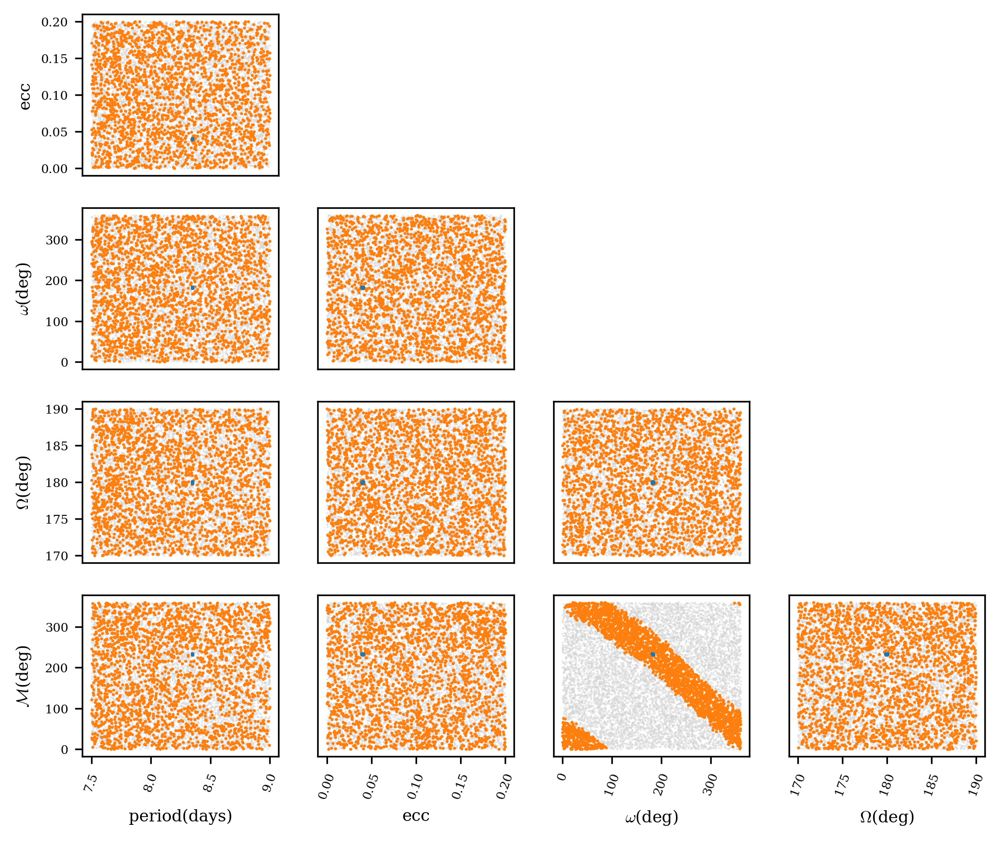

In [15]:
pars = [prn, ern, wrn, lnrn, marn]
pnames = ["period(days)", "ecc", "$\omega$(deg)", "$\Omega$(deg)", "$\mathcal{M}$(deg)"]
cnames = ["Pc", "ecc_c",  "argp_c",  "longn_c",  "meana_c"]
nfit = len(pars)

fig = plt.figure(figsize=(10,10))
axs = []

cnt=0
for ix in range(0, nfit, 1):
    xval = pars[ix]
    xlab = pnames[ix]
    xc = np.array(samples[cnames[ix]])
    for iy in range(nfit - 1, -1, -1):
        yval = pars[iy]
        ylab = pnames[iy]
        yc = np.array(samples[cnames[iy]])
        ll = f"{cnt:2d}: ({ix},{iy}) = ({xlab},{ylab})"
        if iy > ix:
            cnt += 1
            ax = plt.subplot2grid((nfit + 1, nfit), (iy, ix))
            # ax.text(0.1, 0.5, ll, fontsize=4)
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            scatter_corr(ax, xval, xlab, yval, ylab, sel_within1d)
            ax.plot(
                xc, yc,
                color="C0", 
                marker="o",
                ms=1.6,
                mec='None',
                ls='',
                zorder=8,
                alpha=1
            )
            if iy == nfit - 1:
                ax.get_xaxis().set_visible(True)
                ax.xaxis.set_tick_params(labelsize=6)
                plt.setp(ax.xaxis.get_majorticklabels(), rotation=70)
                ax.set_xlabel(xlab, fontsize=8, rotation=00.0)
            if ix == 0:
                ax.get_yaxis().set_visible(True)
                ax.yaxis.set_tick_params(labelsize=6)
                ax.set_ylabel(ylab, fontsize=8, rotation=90.0)
            axs.append(ax)
            print(ll)

fig.align_ylabels(axs)
fig.align_xlabels(axs)
# plt.tight_layout()
plt.show()
plt.close(fig)

## K2-24

In [16]:
k24_folder = os.path.abspath(
    "/data1/borsato/exoplanets/objects/Kepler/Kepler-K2/K2-24/sims/CHEOPS/2024-07-23_K2-24_test_amd_new_assign/de_emcee_run_001/"
)
posterior_file = os.path.join(
    k24_folder, "posterior.hdf5"
)

posterior samples

loading posterior from /data1/borsato/exoplanets/objects/Kepler/Kepler-K2/K2-24/sims/CHEOPS/2024-07-23_K2-24_test_amd_new_assign/de_emcee_run_001/posterior.hdf5
fixed_names    = ['R1' 'R2' 'i2' 'lN2' 'R3' 'i3' 'lN3' 'R4' 'e4' 'w4' 'i4' 'lN4']
fitting_names  = ['m1', 'm2Ms', 'P2', 'secosw2', 'sesinw2', 'lambda2', 'm3Ms', 'P3', 'secosw3', 'sesinw3', 'lambda3', 'm4Ms', 'P4', 'lambda4', 'l2j_1', 'l2j_2', 'l2j_3', 'gamma_1', 'gamma_2', 'gamma_3']
physical_names = ['m2', 'e2', 'w2', 'mA2', 'm3', 'e3', 'w3', 'mA3', 'm4', 'mA4', 'jitter_1', 'jitter_2', 'jitter_3']
loading observation times
planet t_epoch --> obsT0
2 2456905.0  -->  2456905.79529
3 2456905.0  -->  2456915.62477
setting samples
2  -->  Stats(mean=-0.40504, std=6.22756, median=-1.08178, p68=7.29879)
3  -->  Stats(mean=-0.35202, std=12.37176, median=-0.65859, p68=14.55144)
generating random samples
2  -->  Stats(mean=-0.05056, std=5.74012, median=-0.09854, p68=6.72990)
3  -->  Stats(mean=-0.28962, std=12.24677, median=-0.43527, p6

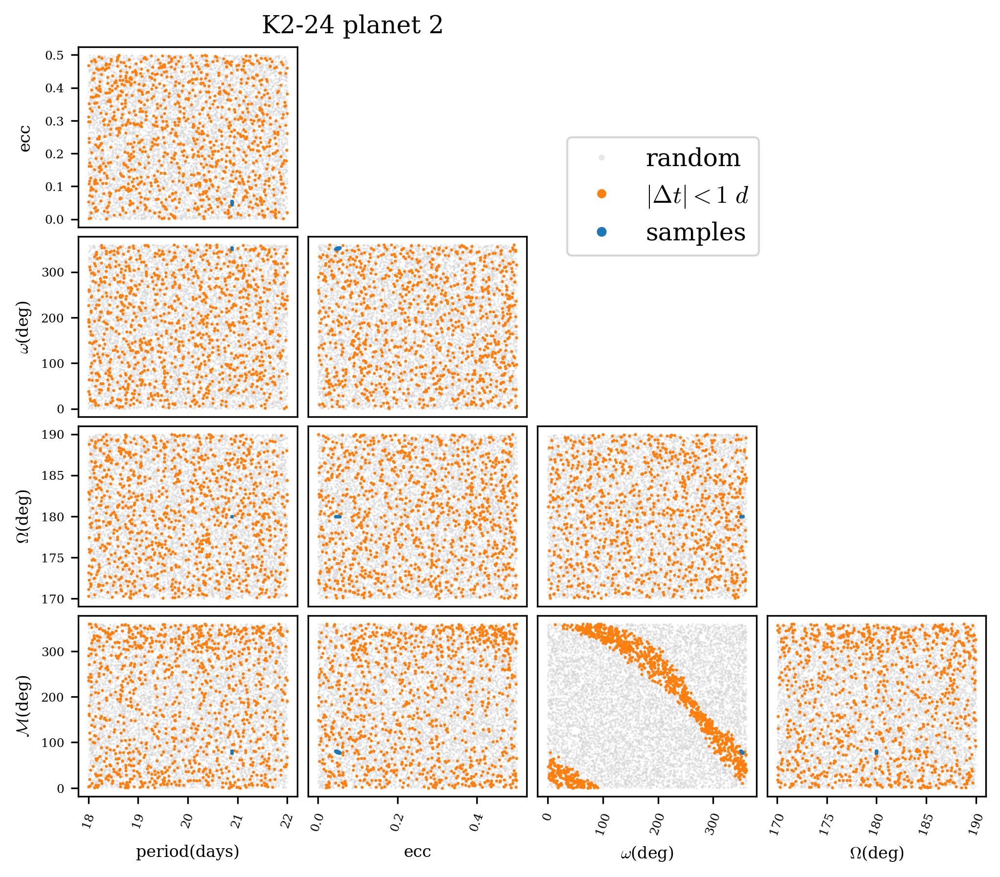

K2-24 planet 3
 0: (0,4) = (period(days): 42.37737,$\mathcal{M}$(deg): 223.92650)
 1: (0,3) = (period(days): 42.37737,$\Omega$(deg): 180.00000)
 2: (0,2) = (period(days): 42.37737,$\omega$(deg): 138.16177)
 3: (0,1) = (period(days): 42.37737,ecc: 0.02801)
 4: (1,4) = (ecc: 0.02801,$\mathcal{M}$(deg): 223.92650)
 5: (1,3) = (ecc: 0.02801,$\Omega$(deg): 180.00000)
 6: (1,2) = (ecc: 0.02801,$\omega$(deg): 138.16177)
 7: (2,4) = ($\omega$(deg): 138.16177,$\mathcal{M}$(deg): 223.92650)
 8: (2,3) = ($\omega$(deg): 138.16177,$\Omega$(deg): 180.00000)
 9: (3,4) = ($\Omega$(deg): 180.00000,$\mathcal{M}$(deg): 223.92650)


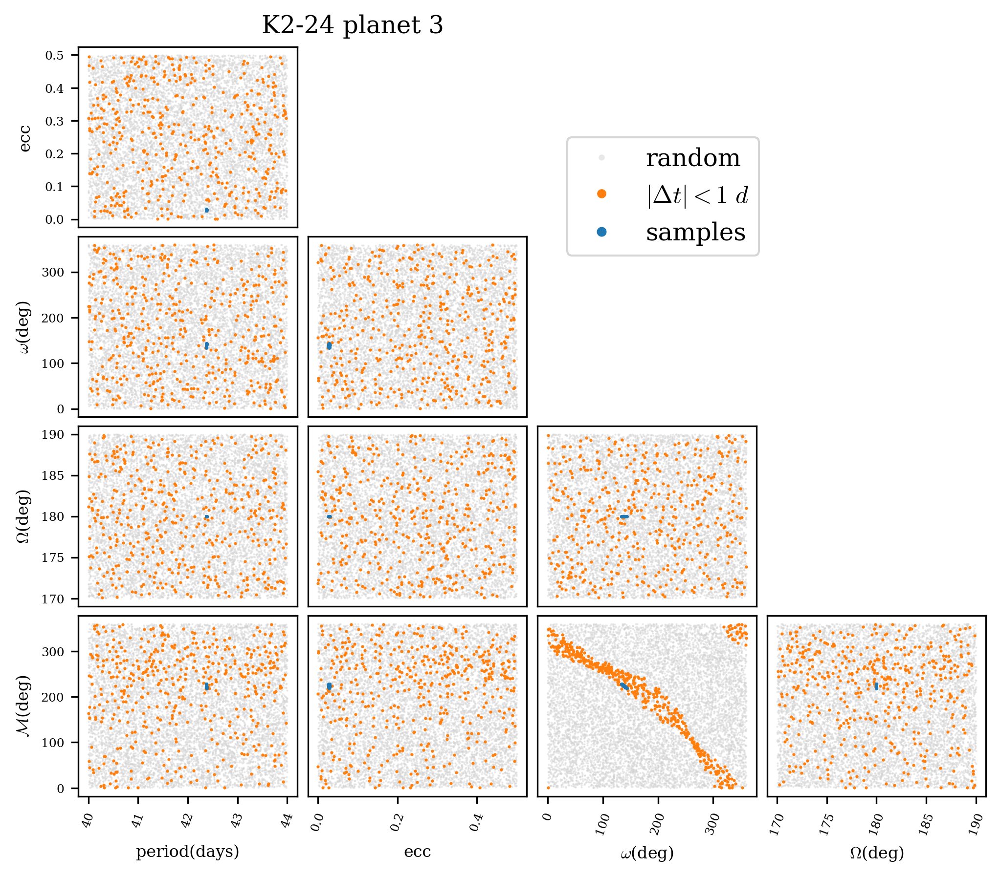

In [17]:
t_epoch = 2456905.0
nsmp = 2000
seed1 = 42
seed2 = 42666
nrandom = 10000
planet_nums = [2,3]

Pbd = [[18.0, 22.0],[40.0, 44.0]]
ebd = [[0.0, 0.5],[0.0, 0.5]]
abd = [[0.0, 360.0], [0.0, 360.0]]
lbd = [[170.0, 190.0], [170.0, 190.0]]

k24 = FULLSIM(
    k24_folder,
    t_epoch,
    target_name="K2-24",
    planet_nums=planet_nums,
    nsmp=nsmp,
    seed=seed1
)
k24.load_posterior()
k24.load_observation_times()
k24.set_samples()
k24.generate_random(Pbd, ebd, abd, lbd, nx=nrandom, seed=seed2)
k24.plot()

## Kepler-9

In [18]:
k9_folder = os.path.abspath(
    "/data1/borsato/exoplanets/objects/Kepler/Kepler-9/sims/TEST_TRADES_EXAMPLE/Kepler-9_example_2025-09-24/de_emcee/"
)
posterior_file = os.path.join(
    k9_folder, "posterior.hdf5"
)

loading posterior from /data1/borsato/exoplanets/objects/Kepler/Kepler-9/sims/TEST_TRADES_EXAMPLE/Kepler-9_example_2025-09-24/de_emcee/posterior.hdf5
fixed_names    = ['m1' 'R1' 'R2' 'lN2' 'R3']
fitting_names  = ['m2Ms', 'P2', 'secosw2', 'sesinw2', 'lambda2', 'i2', 'm3Ms', 'P3', 'secosw3', 'sesinw3', 'lambda3', 'i3', 'lN3', 'l2j_1', 'gamma_1']
physical_names = ['m2', 'e2', 'w2', 'mA2', 'm3', 'e3', 'w3', 'mA3', 'jitter_1']
loading observation times
planet t_epoch --> obsT0
2 2455088.212  -->  2455073.432745525
3 2455088.212  -->  2455086.3133344436
setting samples
2  -->  Stats(mean=1.26641, std=6.20342, median=3.28278, p68=6.22428)
3  -->  Stats(mean=0.97315, std=10.82651, median=1.49156, p68=12.62539)
generating random samples
2  -->  Stats(mean=0.05493, std=5.60077, median=0.12466, p68=6.59288)
3  -->  Stats(mean=0.33425, std=11.26178, median=0.60342, p68=13.29433)
Selecting Tc within 1 day for closest observed transit time
1077/10000=10.77%
2  -->  Stats(mean=0.03070, std=0.57097, m

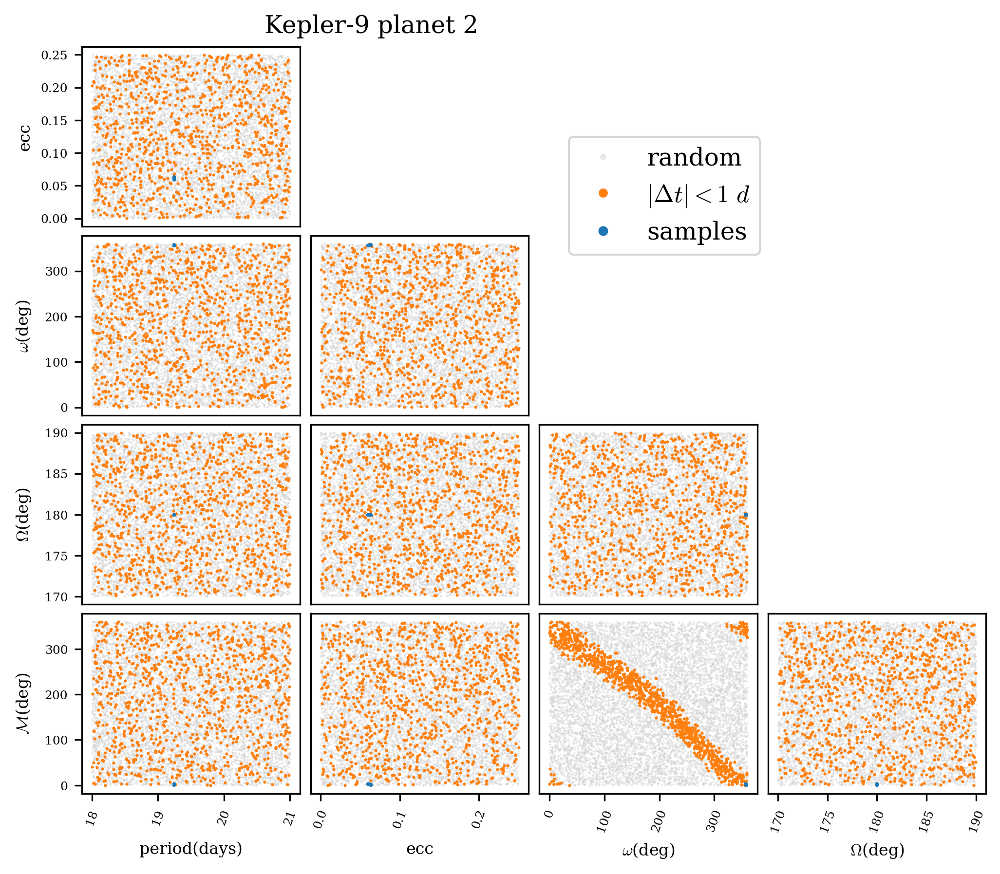

Kepler-9 planet 3
 0: (0,4) = (period(days): 38.98513,$\mathcal{M}$(deg): 308.04031)
 1: (0,3) = (period(days): 38.98513,$\Omega$(deg): 178.68492)
 2: (0,2) = (period(days): 38.98513,$\omega$(deg): 166.83855)
 3: (0,1) = (period(days): 38.98513,ecc: 0.06666)
 4: (1,4) = (ecc: 0.06666,$\mathcal{M}$(deg): 308.04031)
 5: (1,3) = (ecc: 0.06666,$\Omega$(deg): 178.68492)
 6: (1,2) = (ecc: 0.06666,$\omega$(deg): 166.83855)
 7: (2,4) = ($\omega$(deg): 166.83855,$\mathcal{M}$(deg): 308.04031)
 8: (2,3) = ($\omega$(deg): 166.83855,$\Omega$(deg): 178.68492)
 9: (3,4) = ($\Omega$(deg): 178.68492,$\mathcal{M}$(deg): 308.04031)


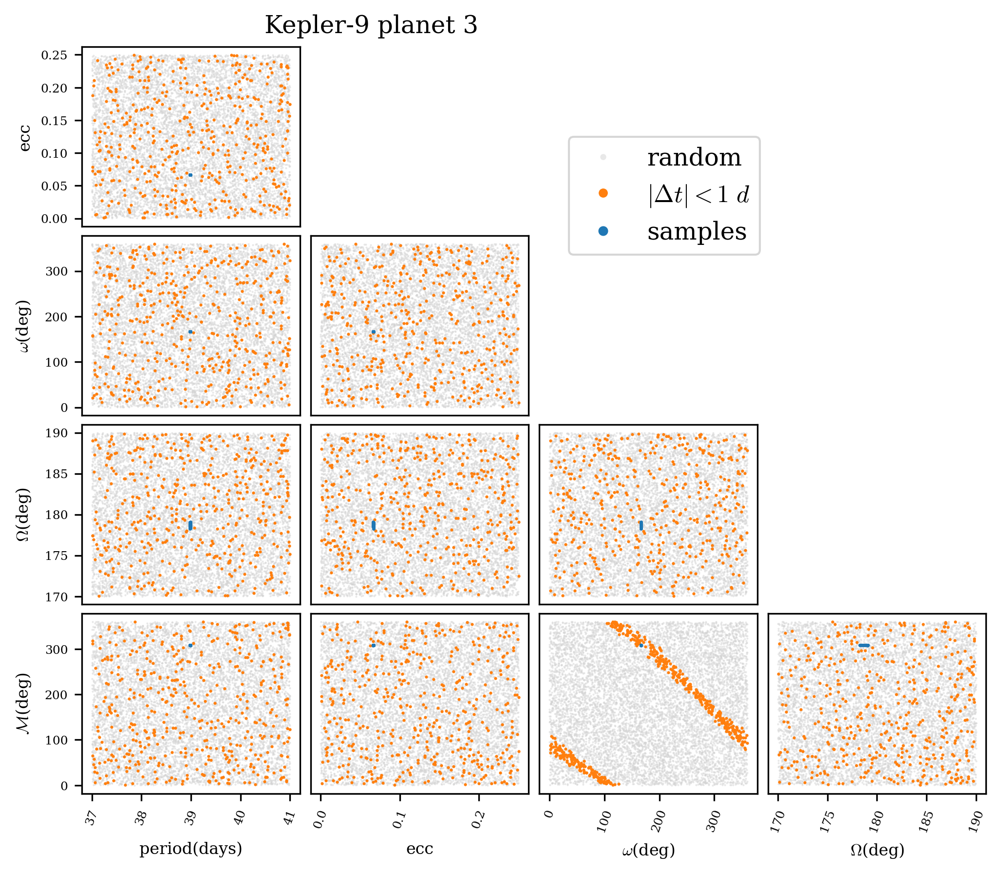

In [19]:
t_epoch = 2455088.212
nsmp = 2000
seed1 = 42
seed2 = 42666
nrandom = 10000
planet_nums = [2,3]

Pbd = [[18.0, 21.0],[37.0, 41.0]]
ebd = [[0.0, 0.25],[0.0, 0.25]]
abd = [[0.0, 360.0], [0.0, 360.0]]
lbd = [[170.0, 190.0], [170.0, 190.0]]

k9 = FULLSIM(
    k9_folder,
    t_epoch,
    target_name="Kepler-9",
    planet_nums=planet_nums,
    nsmp=nsmp,
    seed=seed1
)
k9.load_posterior()
k9.load_observation_times()
k9.set_samples()
k9.generate_random(Pbd, ebd, abd, lbd, nx=nrandom, seed=seed2)
k9.plot()

## TOI-282 by PLeonardi @ nyx

In [20]:
toi282_folder = os.path.abspath(
    "/data1/borsato/exoplanets/objects/TESS/TOI/TOI-282/test_ln_cd/test_emcee/"
)
posterior_file = os.path.join(
    toi282_folder, "posterior.hdf5"
)

loading posterior from /data1/borsato/exoplanets/objects/TESS/TOI/TOI-282/test_ln_cd/test_emcee/posterior.hdf5
fixed_names    = ['m1' 'R1' 'R2' 'i2' 'lN2' 'R3' 'i3' 'R4' 'i4']
fitting_names  = ['m2Ms', 'P2', 'secosw2', 'sesinw2', 'lambda2', 'm3Ms', 'P3', 'secosw3', 'sesinw3', 'lambda3', 'lN3', 'm4Ms', 'P4', 'secosw4', 'sesinw4', 'lambda4', 'lN4', 'l2j_1', 'l2j_2', 'l2j_3', 'gamma_1', 'gamma_2', 'gamma_3']
physical_names = ['m2', 'e2', 'w2', 'mA2', 'm3', 'e3', 'w3', 'mA3', 'm4', 'e4', 'w4', 'mA4', 'jitter_1', 'jitter_2', 'jitter_3']
loading observation times
planet t_epoch --> obsT0
2 2458337.0  -->  2458344.81349133
3 2458337.0  -->  2458337.2106666
4 2458337.0  -->  2458355.67566882
setting samples
2  -->  Stats(mean=-0.05514, std=6.59510, median=-0.36829, p68=7.73235)
3  -->  Stats(mean=-0.24855, std=16.04269, median=-0.10631, p68=18.68236)
4  -->  Stats(mean=0.33509, std=24.32366, median=0.07545, p68=28.74606)
generating random samples
2  -->  Stats(mean=0.05224, std=6.45378, median

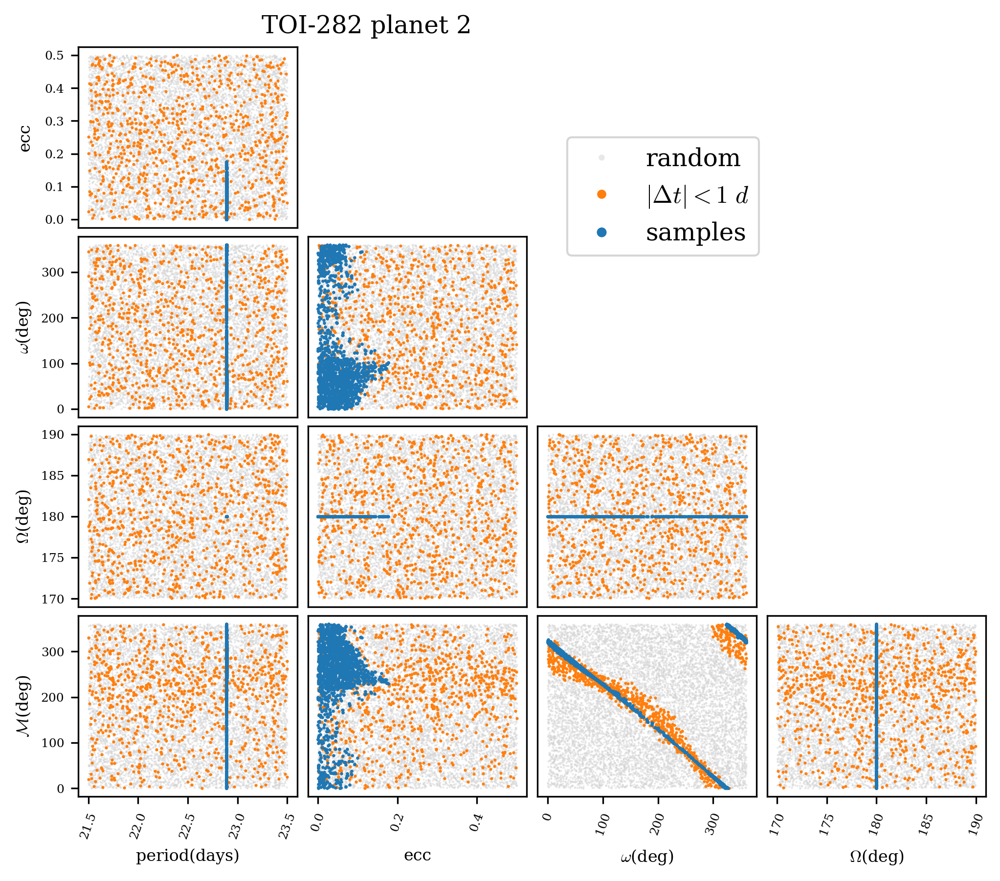

TOI-282 planet 3
 0: (0,4) = (period(days): 56.00633,$\mathcal{M}$(deg): 23.90353)
 1: (0,3) = (period(days): 56.00633,$\Omega$(deg): 180.49068)
 2: (0,2) = (period(days): 56.00633,$\omega$(deg): 76.95754)
 3: (0,1) = (period(days): 56.00633,ecc: 0.01025)
 4: (1,4) = (ecc: 0.01025,$\mathcal{M}$(deg): 23.90353)
 5: (1,3) = (ecc: 0.01025,$\Omega$(deg): 180.49068)
 6: (1,2) = (ecc: 0.01025,$\omega$(deg): 76.95754)
 7: (2,4) = ($\omega$(deg): 76.95754,$\mathcal{M}$(deg): 23.90353)
 8: (2,3) = ($\omega$(deg): 76.95754,$\Omega$(deg): 180.49068)
 9: (3,4) = ($\Omega$(deg): 180.49068,$\mathcal{M}$(deg): 23.90353)


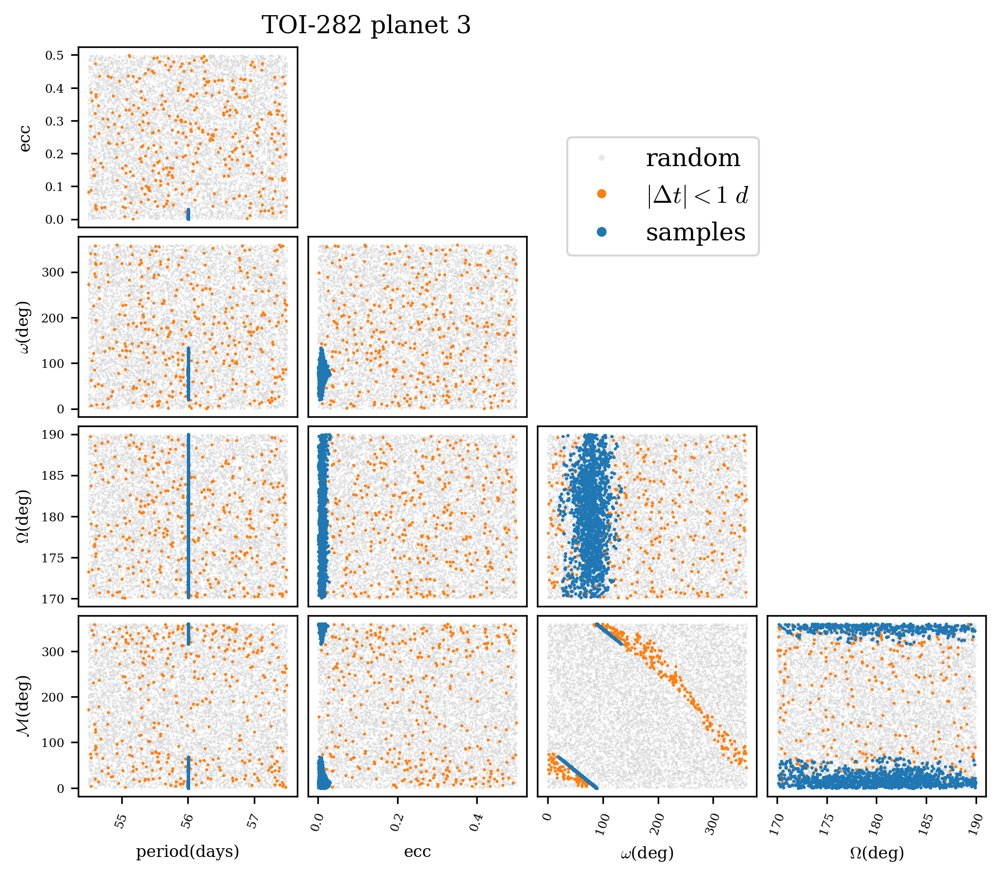

TOI-282 planet 4
 0: (0,4) = (period(days): 84.27051,$\mathcal{M}$(deg): 141.18150)
 1: (0,3) = (period(days): 84.27051,$\Omega$(deg): 181.05763)
 2: (0,2) = (period(days): 84.27051,$\omega$(deg): 224.17911)
 3: (0,1) = (period(days): 84.27051,ecc: 0.00315)
 4: (1,4) = (ecc: 0.00315,$\mathcal{M}$(deg): 141.18150)
 5: (1,3) = (ecc: 0.00315,$\Omega$(deg): 181.05763)
 6: (1,2) = (ecc: 0.00315,$\omega$(deg): 224.17911)
 7: (2,4) = ($\omega$(deg): 224.17911,$\mathcal{M}$(deg): 141.18150)
 8: (2,3) = ($\omega$(deg): 224.17911,$\Omega$(deg): 181.05763)
 9: (3,4) = ($\Omega$(deg): 181.05763,$\mathcal{M}$(deg): 141.18150)


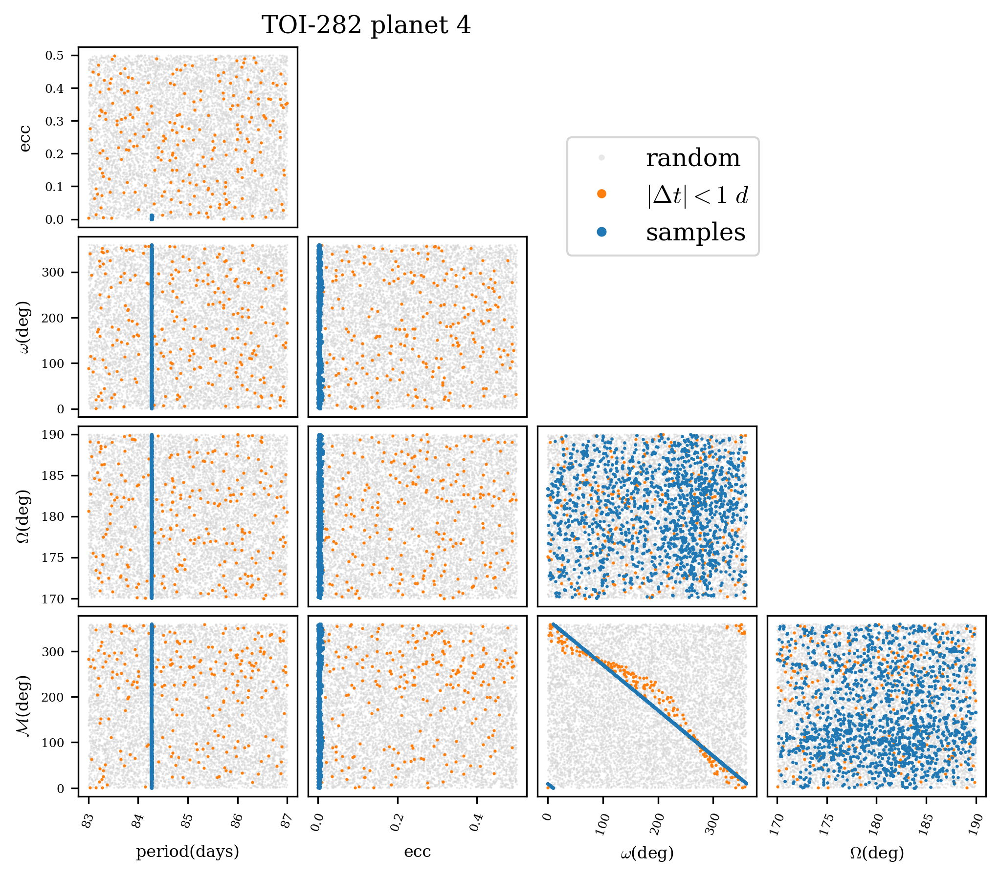

In [21]:
t_epoch = 2458337.0
nsmp = 2000
seed1 = 42
seed2 = 42666
nrandom = 10000
planet_nums = [2,3,4]

Pbd = [[21.5, 23.5],[54.5, 57.5],[83.0, 87.0]]
ebd = [[0.0, 0.5],[0.0, 0.5],[0.0, 0.5]]
abd = [[0.0, 360.0], [0.0, 360.0],[0.0, 360.0]]
lbd = [[170.0, 190.0], [170.0, 190.0],[170.0, 190.0]]

toi282 = FULLSIM(
    toi282_folder,
    t_epoch,
    target_name="TOI-282",
    planet_nums=planet_nums,
    nsmp=nsmp,
    seed=seed1
)
toi282.load_posterior()
toi282.load_observation_times()
toi282.set_samples()
toi282.generate_random(Pbd, ebd, abd, lbd, nx=nrandom, seed=seed2)
toi282.plot()